<a href="https://colab.research.google.com/github/SofiaFreiman/Erythropoiesis/blob/main/GSE133181_load_QC_PP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install scanpy leidenalg scikit-misc scvi-tools gprofiler-official pybiomart bbknn celltypist decoupler omnipath scrublet harmonypy
import os
os.kill(os.getpid(), 9)

In [ ]:
import os
os.kill(os.getpid(), 9)

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import time
import os
import pandas as pd
import numpy as np
import scipy.stats
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy.external as sce
import anndata
import celltypist
from celltypist import models
import scvi

sc.settings.verbosity = 1
sns.set(font_scale = 1)
sns.set_style("whitegrid")

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor="white", frameon=False)

## Foo

In [ ]:
def qc(adata):
  fig, axs = plt.subplots(ncols = 7, nrows = 1, figsize = (25, 2), layout = "constrained")

  sns.distplot(adata.obs['total_counts'], kde = False, ax = axs[0], hist_kws={"alpha":1}, color = 'g')
  axs[0].set_xlabel("n UMI per cell (total counts)", fontsize = 10); axs[0].set_ylabel('n cells', fontsize = 10);
  axs[0].set_xlim(0, 80000);
  axs[0].xaxis.set_major_locator(plt.MaxNLocator(5))

  sns.distplot(adata.obs['n_genes_by_counts'], kde = False, ax = axs[1], hist_kws={"alpha":1}, color = 'b')
  axs[1].set_xlabel("n genes per cell", fontsize = 10); axs[1].set_ylabel('n cells', fontsize = 10);

  sns.scatterplot(y = adata.obs["n_genes_by_counts"], x = adata.obs["total_counts"], ax=axs[2], s = 3, color = 'goldenrod')
  axs[2].set_xlabel("n UMI per cell (total counts)", fontsize = 10); axs[2].set_ylabel("n genes per cell", fontsize = 10)
  axs[2].xaxis.set_major_locator(plt.MaxNLocator(5))

  variances = np.var(adata.X.A, axis=0)
  means = adata.X.mean(axis=0).A[0][variances > 0]
  variances = variances[variances > 0]
  sns.scatterplot(x = means, y = variances, ax=axs[3], s = 3)
  axs[3].set_xscale("log"); axs[3].set_yscale("log")

  sns.distplot(adata.obs["pct_counts_mt"], kde = False, ax = axs[4], hist_kws={"alpha":1}, color = 'firebrick', bins = 100)
  axs[4].set_xlabel("% of mt expression", fontsize = 10); axs[4].set_ylabel('n cells', fontsize = 10)

  sns.distplot(adata.obs["pct_counts_ribo"], kde = False, ax = axs[5], hist_kws={"alpha":1}, color = 'firebrick', bins = 100)
  axs[5].set_xlabel("% of ribo expression", fontsize = 10); axs[5].set_ylabel('n cells', fontsize = 10)

  sns.distplot(adata.obs["pct_counts_hb"], kde = False, ax = axs[6], hist_kws={"alpha":1}, color = 'firebrick')
  axs[6].set_xlabel("% of hb expression", fontsize = 10); axs[6].set_ylabel('n cells', fontsize = 10)

In [ ]:
from scipy.stats import median_abs_deviation

def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M)
    return outlier

## Thalassemia & Sickle Cell disease GSE133181
4 healthy, 3 thalassemia major and 5 sickle cell donors' bone marrow CD34+ cells \
10X chromium, Illumina NovaSeq 6000 \
https://ashpublications.org/blood/article/134/23/2111/387151/Single-cell-analysis-of-bone-marrow-derived-CD34 \


In [ ]:
!ls drive/MyDrive/LU/Erythropoiesis/GSE133181

BM1_azimuth_pred.tsv  C1_azimuth_pred.tsv  GSM3901491_BT3   SCD1_azimuth_pred.tsv
BM2_azimuth_pred.tsv  GSM3901485_BM1	   GSM3901492_C1    SCD2_azimuth_pred.tsv
BM3_azimuth_pred.tsv  GSM3901486_BM2	   GSM3901493_SCD1  SCD3_azimuth_pred.tsv
BM4_azimuth_pred.tsv  GSM3901487_BM3	   GSM3901494_SCD2  SCD4_azimuth_pred.tsv
BT1_azimuth_pred.tsv  GSM3901488_BM4	   GSM3901495_SCD3  SCD5_azimuth_pred.tsv
BT2_azimuth_pred.tsv  GSM3901489_BT1	   GSM3901496_SCD4
BT3_azimuth_pred.tsv  GSM3901490_BT2	   GSM3901498_SCD5


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Load

In [ ]:
prefix_ls = []
for i in os.listdir(path + 'GSE133181'):
  if "azimuth_pred" not in i:
    prefix_ls.append(i)
prefix_ls

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['GSM3901485_BM1',
 'GSM3901486_BM2',
 'GSM3901487_BM3',
 'GSM3901488_BM4',
 'GSM3901489_BT1',
 'GSM3901490_BT2',
 'GSM3901491_BT3',
 'GSM3901492_C1',
 'GSM3901493_SCD1',
 'GSM3901494_SCD2',
 'GSM3901495_SCD3',
 'GSM3901496_SCD4',
 'GSM3901498_SCD5']

In [ ]:
adata_ls =[]
for i in prefix_ls:
  adata = sc.read_10x_mtx(path + 'GSE133181/' + i, cache=True)
  donor = i.split("_")[1]
  adata.uns["name"] = donor
  adata.obs["donor"] = donor
  adata.obs['dataset'] = "GSE133181"
  adata_ls.append(adata)

In [ ]:
adata.obs["state"] = adata.obs['donor'].replace({"BM1" : "healthy", "BM2" : "healthy", "BM3" : "healthy", "BM4" : "healthy",
                                                 "BT1" : "thalassemia", "BT2" : "thalassemia", "BT3" : "thalassemia",
                                                 "SCD1" : "sickle cell", "SCD2" : "sickle cell", "SCD3" : "sickle cell", "SCD4" : "sickle cell", "SCD5" : "sickle cell",
                                                 "C1" : "healthy"})

In [ ]:
for n, i in enumerate(adata_ls):
  adata_ls[n].obs.index = [ind.split("-")[0] for ind in adata_ls[n].obs.index]
  adata_ls[n].obs.index = [ind + "_" + adata_ls[n].uns["name"] for ind in adata_ls[n].obs.index]

### Celltypist

In [ ]:
import celltypist
from celltypist import models
models.download_models(force_update = True)
model_fine = models.Model.load(model="Immune_All_Low.pkl")
model_coarse = models.Model.load(model="Immune_All_High.pkl")

In [ ]:
for n, i in enumerate(adata_ls):
  adata_ls[n].layers["counts"] = adata_ls[n].X.copy()
  sc.pp.normalize_total(adata_ls[n], target_sum=1e4)
  sc.pp.log1p(adata_ls[n])
  sc.pp.highly_variable_genes(adata_ls[n], n_top_genes=3000, layer="counts", flavor="seurat_v3")
  sc.pp.pca(adata_ls[n], use_highly_variable = True)
  sc.pp.neighbors(adata_ls[n])
  sc.tl.umap(adata_ls[n])

In [ ]:
for n, i in enumerate(adata_ls):
  predictions = celltypist.annotate(adata_ls[n], model=model_coarse, majority_voting=True)
  pred_adata = predictions.to_adata()
  adata_ls[n].obs["celltypist_pred_coarse_labels"]  = pred_adata.obs["predicted_labels"]
  adata_ls[n].obs["celltypist_pred_coarse_voting"] = pred_adata.obs["majority_voting"]
  adata_ls[n].obs["celltypist_pred_coarse_conf_score"] = pred_adata.obs["conf_score"]

annotated_fine_adata_ls = []
for n, i in enumerate(adata_ls):
  predictions = celltypist.annotate(adata_ls[n], model=model_fine, majority_voting=True)
  pred_adata = predictions.to_adata()
  adata_ls[n].obs["celltypist_pred_fine_labels"]  = pred_adata.obs["predicted_labels"]
  adata_ls[n].obs["celltypist_pred_fine_voting"] = pred_adata.obs["majority_voting"]
  adata_ls[n].obs["celltypist_pred_fine_conf_score"] = pred_adata.obs["conf_score"]

In [ ]:
for n, i in enumerate(adata_ls):
  adata_ls[n].X = adata_ls[n].layers["counts"].copy()

In [ ]:
adata_ls[0].obs[:2]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,donor,dataset,predicted_labels,majority_voting,conf_score,celltypist_pred_coarse_labels,celltypist_pred_coarse_voting,celltypist_pred_coarse_conf_score,over_clustering,celltypist_pred_fine_labels,celltypist_pred_fine_voting,celltypist_pred_fine_conf_score
AAACCTGAGATATGCA_BM1,BM1,GSE133181,HSC/MPP,HSC/MPP,0.413978,HSC/MPP,HSC/MPP,0.172415,100,HSC/MPP,HSC/MPP,0.413978
AAACCTGAGATCCTGT_BM1,BM1,GSE133181,ETP,HSC/MPP,0.039744,ETP,HSC/MPP,0.131788,26,ETP,HSC/MPP,0.039744


### Concat

In [ ]:
adata = sc.concat(adata_ls)
adata

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


AnnData object with n_obs × n_vars = 61430 × 33694
    obs: 'donor', 'dataset', 'predicted_labels', 'majority_voting', 'conf_score', 'celltypist_pred_coarse_labels', 'celltypist_pred_coarse_voting', 'celltypist_pred_coarse_conf_score', 'over_clustering', 'celltypist_pred_fine_labels', 'celltypist_pred_fine_voting', 'celltypist_pred_fine_conf_score'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [ ]:
az_ls = []
for i in os.listdir("drive/MyDrive/LU/Erythropoiesis/GSE133181"):
  if "azimuth_pred" in i:
    donor = i.split("_")[0]
    az = pd.read_csv(path + "GSE133181/" + i, sep = "\t", index_col = 0)
    az.index = [ind.split("-")[0] for ind in az.index]
    az.index = [ind + "_" + donor for ind in az.index]
    az_ls.append(az)

In [ ]:
azimuth = pd.concat(az_ls)
print(len(azimuth))
azimuth[:2]

61430


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,predicted.celltype.l2,predicted.celltype.l1,predicted.celltype.l2.score,predicted.celltype.l1.score,mapping.score
AAACCTGAGATATGCA_BM1,HSC,HSPC,0.419907,0.981061,0.724079
AAACCTGAGATCCTGT_BM1,CLP,HSPC,0.550067,1.000000,0.981177


In [ ]:
adata.obs['cell_type_azimuth_l1'] = azimuth['predicted.celltype.l1']
adata.obs['cell_type_azimuth_l1_score'] = azimuth['predicted.celltype.l1.score']
adata.obs['cell_type_azimuth_l2'] = azimuth['predicted.celltype.l2']
adata.obs['cell_type_azimuth_l2_score'] = azimuth['predicted.celltype.l2.score']
adata.obs[:2]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,donor,dataset,predicted_labels,majority_voting,conf_score,celltypist_pred_coarse_labels,celltypist_pred_coarse_voting,celltypist_pred_coarse_conf_score,over_clustering,celltypist_pred_fine_labels,celltypist_pred_fine_voting,celltypist_pred_fine_conf_score,cell_type_azimuth_l1,cell_type_azimuth_l1_score,cell_type_azimuth_l2,cell_type_azimuth_l2_score
AAACCTGAGATATGCA_BM1,BM1,GSE133181,HSC/MPP,HSC/MPP,0.413978,HSC/MPP,HSC/MPP,0.172415,100,HSC/MPP,HSC/MPP,0.413978,HSPC,0.981061,HSC,0.419907
AAACCTGAGATCCTGT_BM1,BM1,GSE133181,ETP,HSC/MPP,0.039744,ETP,HSC/MPP,0.131788,26,ETP,HSC/MPP,0.039744,HSPC,1.000000,CLP,0.550067


### QC

In [ ]:
adata.layers["counts"] = adata.X.copy()
print(adata.X.max())
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['ribo'] = adata.var_names.str.startswith(("RPS", "RPL"))
adata.var['hb'] = adata.var_names.str.contains(("^HB[^(P)]"))
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt', 'ribo', 'hb'], percent_top=[20], log1p=True, inplace=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


4163.0


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


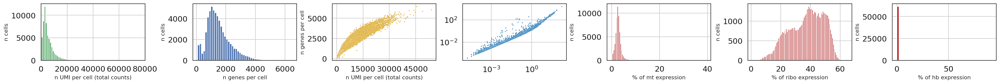

In [ ]:
qc(adata)

In [ ]:
adata.obs["outlier"] = (
    (is_outlier(adata, "log1p_total_counts", 5))
    | (is_outlier(adata, "log1p_n_genes_by_counts", 5))
    # | (is_outlier(adata, "pct_counts_in_top_20_genes", 5))
    | (is_outlier(adata, "pct_counts_mt", 3))
    | (adata.obs["pct_counts_mt"] > 10)
)

adata.obs.outlier.value_counts()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,count
outlier,
False,53044
True,8386


In [ ]:
sce.pp.scrublet(adata)
print(adata.obs['predicted_doublet'].value_counts())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


predicted_doublet
False    61430
Name: count, dtype: int64


In [ ]:
adata.X.max()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


4163.0

In [ ]:
# sc.pp.normalize_total(adata)
# sc.pp.log1p(adata)
# adata.layers['lognorm'] = adata.X.copy()
sc.pp.highly_variable_genes(adata, n_top_genes=3000, layer="lognorm", flavor="cell_ranger", batch_key="donor")
sc.pp.pca(adata, use_highly_variable = True)
sce.pp.bbknn(adata, batch_key='donor')
sc.tl.umap(adata)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


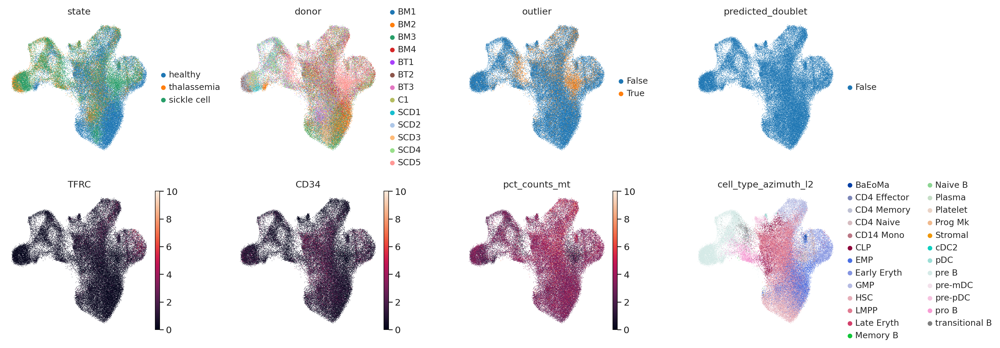

In [ ]:
sc.pl.umap(adata, layer = "counts", color = ["state", "donor", 'outlier', 'predicted_doublet', "TFRC", "CD34", "pct_counts_mt", 'cell_type_azimuth_l2'], wspace=0.4, ncols = 4, vmax = [10])

In [ ]:
print(adata.shape)
adata = adata[~adata.obs["outlier"]]
adata = adata[~adata.obs["predicted_doublet"]]
print(adata.shape)

(61430, 33694)
(53044, 33694)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


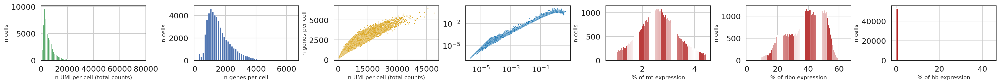

In [ ]:
qc(adata)

In [ ]:
sc.pp.highly_variable_genes(adata, n_top_genes=3000, layer="lognorm", flavor="cell_ranger", batch_key="donor")
sc.pp.pca(adata, use_highly_variable = True)
sce.pp.bbknn(adata, batch_key='donor')
sc.tl.umap(adata)

In [ ]:
print(adata.X.max())
print(adata.layers["counts"].max())
print(adata.layers["lognorm"].max())

7.3310466
2858.0
7.3310466


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


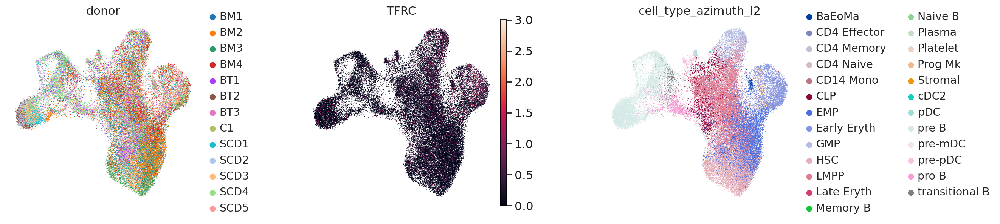

In [ ]:
sc.pl.umap(adata, color = ["donor", "TFRC", 'cell_type_azimuth_l2'], wspace=0.4, ncols = 4)

### Manual annotation

In [ ]:
markers = dict(
  Tcell = ['CD3D','TRAC','CD8A','CD4','CXCR4'] + ['BTG1'],
  Mac = ['TYROBP','FCER1G','CD14','S100A8','S100A9','LYZ'],
  Bcell = ['CD27','CD74','CD79B','IGKC','IGHM','MZB1'],
  DC = ['PLD4','ITM2C','JCHAIN','CD40','PLIN2','LGALS3BP'],
  NK = ['GNLY','NKG7','PRF1','KLRB1','GZMA', 'CTSW'],
  Neu = ['PRSS57','SMIM24','ELANE','AZU1','PRTN3','CFD'],
  Ery = ['HBA1','CA1','SLC4A1','GYPA','TFRC','HMGA1'],
  Meg = ['CD9', 'LOX', 'VWF', 'NFIB', 'TGFB1', 'FLI1'],
  Mast = ['CCL2', 'CREB3L1', 'GNAI1', 'PLAU', 'KCNE3', 'SRGN'],
  MPP = ['KIT', 'CCL2', 'GATA2', 'GATA4', 'RUNX1', 'TRIM33'],
  CLP = ['SPINK2', 'CD79A','EBF1','IGHM'], #'DNTT',
  Mito = ['MT-ND1','MT-ND3','MT-ND4','MT-CO2','MT-CYB'],
  Hb = ['HBA1','HBA2','HBB','HBG1','HBG2','HBD','HBE1','HBZ']
  )

adata.uns['markers'] = markers

for i in adata.uns['markers'].keys():
  sc.tl.score_genes(adata, adata.uns['markers'][i], score_name=i)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


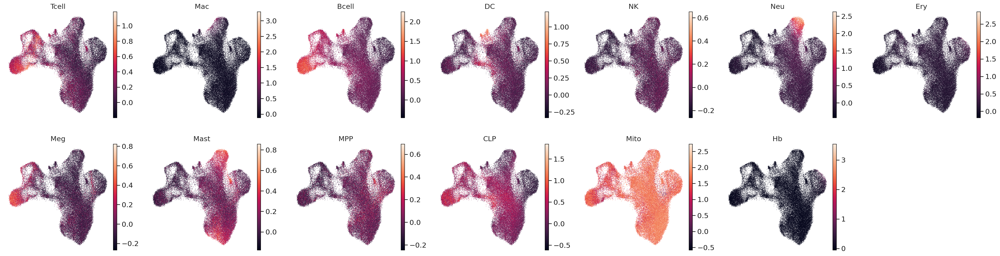

In [ ]:
sc.pl.umap(adata, color = markers, ncols = 7)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


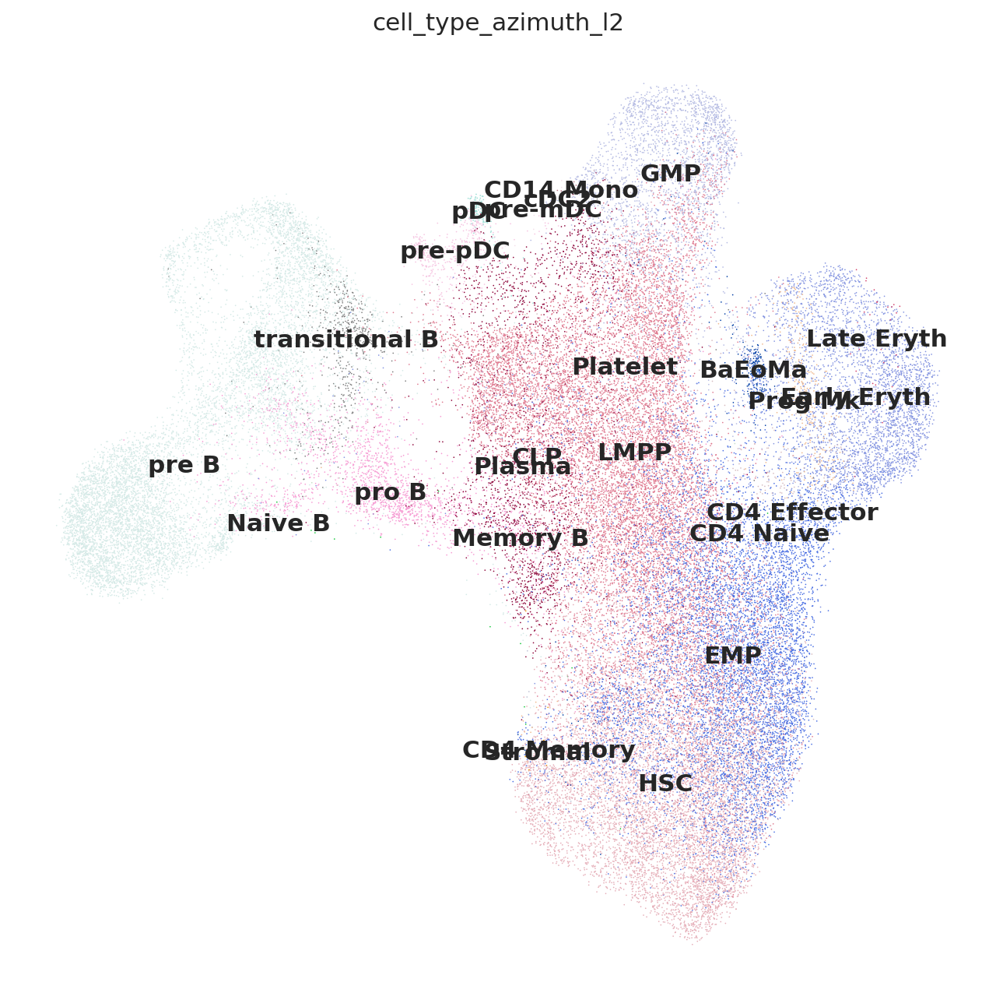

In [ ]:
fig, ax = plt.subplots(1,1, figsize = (10,10))
sc.pl.umap(adata, color = 'cell_type_azimuth_l2', legend_loc = 'on data', ax = ax)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


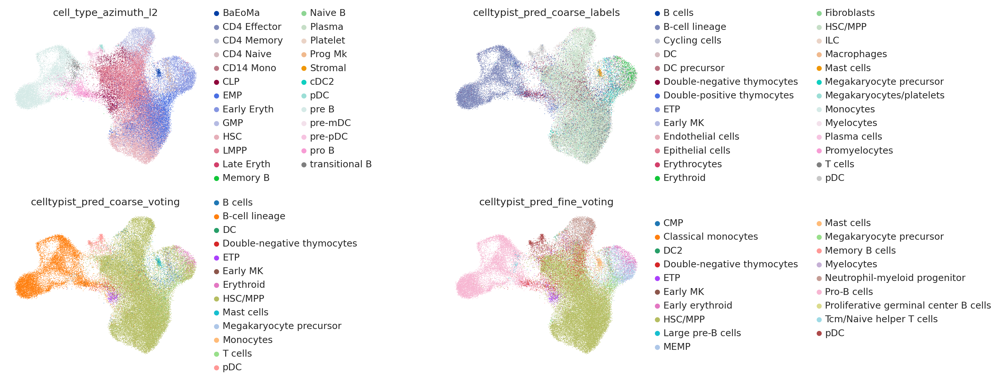

In [ ]:
sc.pl.umap(adata, color = ['cell_type_azimuth_l2', 'celltypist_pred_coarse_labels', 'celltypist_pred_coarse_voting', 'celltypist_pred_fine_voting'], ncols = 2, wspace = 1)

In [ ]:
for i in [0.5, 1, 1.5, 2]:
  print(i)
  sc.tl.leiden(adata, resolution = i, key_added = "leiden_res_" + str(i))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0.5
1
1.5
2


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


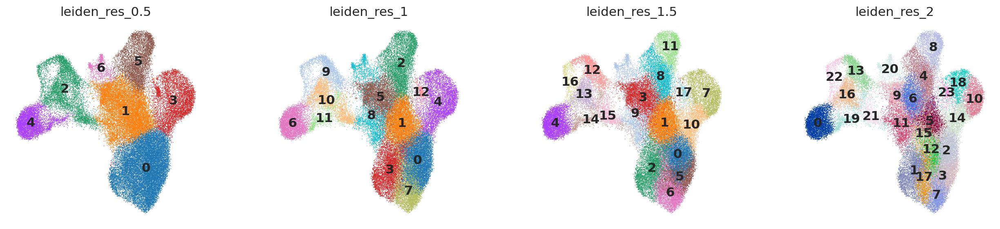

In [ ]:
sc.pl.umap(adata, color = [i for i in adata.obs.columns if "leiden_res" in i], legend_loc = 'on data')

In [ ]:
## Annotation based on leiden-0.5
leiden_to_ct = {
    "3" : "Erythroid precursors",
    "1" : "LMPP", "0" : "LMPP",
    "6" : 'Dendritic cells',
    "5" :"Monocyte precursors",
    "2" : "B-cell lineage", "4" : "B-cell lineage",
    }
adata.obs['anno'] = [leiden_to_ct[i] for i in adata.obs["leiden_res_0.5"]]
adata.obs['anno'] = adata.obs['anno'].astype("category")
adata.obs['anno'] = adata.obs['anno'].cat.add_categories(["Ba/Eo/Ma precursors", "HSCs", "EMPs", "CLPs"])
## Fine correction
for i in adata.obs.index:
  for s in ['12']:
    if adata.obs.loc[i, 'leiden_res_1'] == s:
      adata.obs.loc[i, 'anno'] = 'Ba/Eo/Ma precursors'
  for s in ['11']:
    if adata.obs.loc[i, 'leiden_res_2'] == s:
      adata.obs.loc[i, 'anno'] = 'CLPs'
  for s in ['3', '7', "0"]:
    if adata.obs.loc[i, 'leiden_res_1'] == s:
      adata.obs.loc[i, 'anno'] = 'HSCs'
  for s in ['10',]:
    if adata.obs.loc[i, 'leiden_res_1.5'] == s:
      adata.obs.loc[i, 'anno'] = 'EMPs'
  # for s in ['3', '7', "12"]:
  #   if adata.obs.loc[i, 'leiden_res_2'] == s:
  #     adata.obs.loc[i, 'anno'] = 'HSCs'
  for s in ['2']:
    if adata.obs.loc[i, 'leiden_res_2'] == s:
      adata.obs.loc[i, 'anno'] = 'EMPs'

print(set(adata.obs['anno']))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{'Erythroid precursors', 'HSCs', 'CLPs', 'Dendritic cells', 'Ba/Eo/Ma precursors', 'EMPs', 'Monocyte precursors', 'LMPP', 'B-cell lineage'}


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


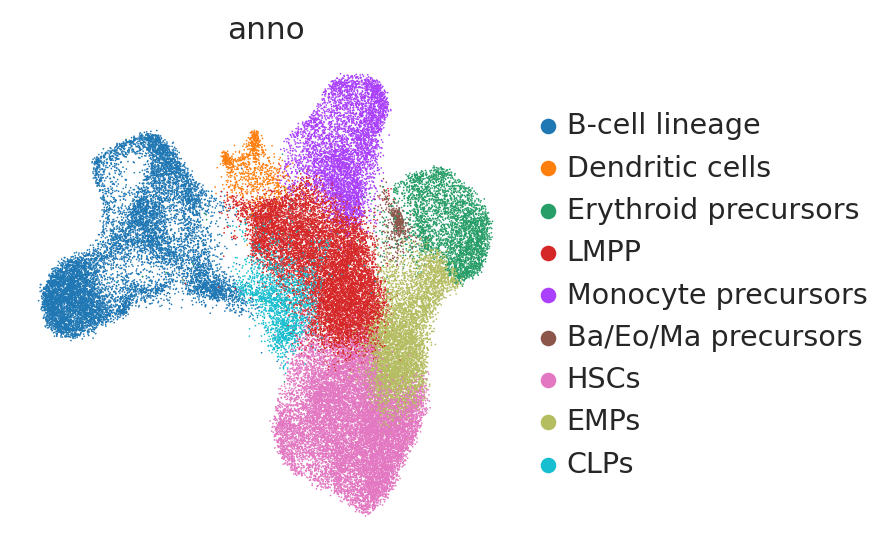

In [ ]:
sc.pl.umap(adata, color = 'anno')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


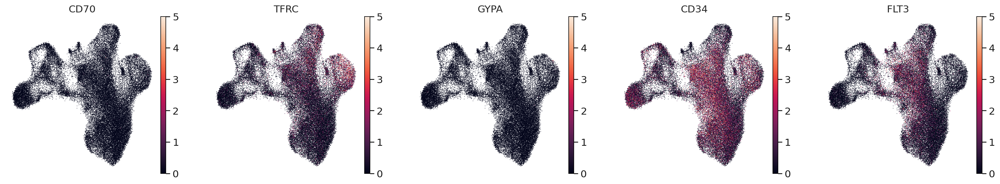

In [ ]:
sc.pl.umap(adata, layer = 'counts', color = ['CD70', "TFRC", "GYPA", "CD34", "FLT3"], vmax = [5, 5, 5, 5, 5], ncols = 5)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


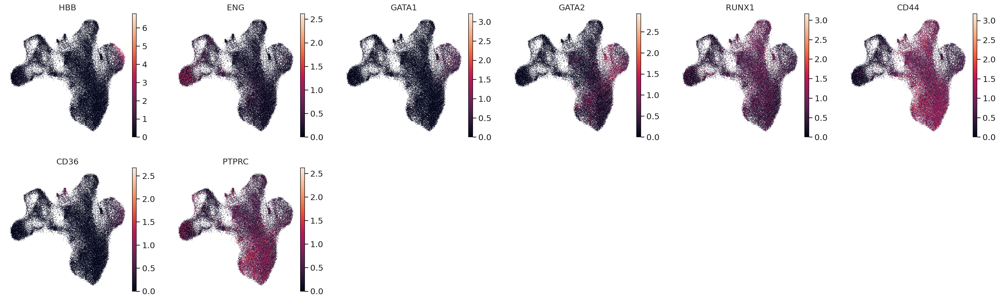

In [ ]:
sc.pl.umap(adata, color = ["HBB", "ENG", "GATA1", "GATA2", "RUNX1", "CD44", "CD36", "PTPRC",], ncols = 6)

### Write

In [ ]:
adata.write("HbbAnemia.h5ad")